<div style='background-color:skyblue;padding:14px'>
<p style='text-align:center'><font size='8px' color=#FFFFF face ='Product Sans'><b>Project Name:-  Credit Card Approval Prediction Dataset</b></font</p></div>



---

## Phase 1: Data Exploration & Initial Assessment
###  Project Context: Credit Card Eligibility Assessment

Credit card issuing companies need to ensure that applicants are financially reliable before approving a credit card. A poor approval decision may result in **defaults**, which lead to financial losses. Therefore, analyzing customer **application information** (demographics, income, family details) along with their **credit repayment history** is essential to decide whether a client is **eligible** or **not eligible** for a credit card.

###  Objective

* To determine **credit card eligibility** of applicants based on their financial and credit history data.
* Eligibility is defined by the customer’s repayment behavior:

  * **Eligible (DEFAULT = 0)** → The client has no serious overdue history.
  * **Not Eligible (DEFAULT = 1)** → The client has a history of serious delinquency (overdue 2+ months).

###  Dataset Details

The project uses two datasets:

1. **Application Record** → demographic and socio-economic details such as gender, age, income, employment, occupation, family size, housing, car & real estate ownership.
2. **Credit Record** → monthly repayment status (`STATUS`), credit history length (`MONTHS_BALANCE`).

After merging:

* Each customer has a **single profile row**.
* A derived column **`DEFAULT`** acts as the target:

  * `0` → customer is **eligible**.
  * `1` → customer is **not eligible**.

###  Business Problem

The task is to identify **which applicants can be safely approved** for a credit card, and **which ones should be rejected** due to past repayment problems.

###  Expected Outcome

* A dataset that clearly marks each customer as **eligible or not eligible**.
* Insights into factors that contribute to **ineligibility**, such as low income, unstable job, or poor repayment history.
* A decision-support tool for credit card approval teams.

---


### 1. Load the Dataset

##### Importing required modules

In [91]:
import numpy as np
import pandas as pd
import random
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go 
import plotly.express as px
import plotly.io as pio

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = 'all'

import warnings
warnings.filterwarnings('ignore')


In [92]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = 'all'

In [93]:
filepath=r"C:\Users\akhil\INNOMATICS\Batch 406\EDA  in python\Pandas\Datasets\merged_application_credit_with_status (1).csv"
df_cc=pd.read_csv(filepath)

#### Note:- `Here we just import neccessary modules to work with Dataset`

In [94]:
df_cc.describe()

,ID,CNT_CHILDREN,AMT_INCOME_TOTAL,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,WORST_STATUS_NUM,DEFAULT
count,36457.00,36457.00,36457.00,36457.00,36457.00,36457.00,36457.00,36457.00,36457.00,36457.00,36457.00,36457.00
mean,5078227.00,0.43,186685.74,-15975.17,59262.94,1.00,0.23,0.29,0.09,2.20,0.15,0.02
std,41875.24,0.74,101789.23,4200.55,137651.33,0.00,0.42,0.46,0.29,0.91,0.52,0.13
min,5008804.00,0.00,27000.00,-25152.00,-15713.00,1.00,0.00,0.00,0.00,1.00,0.00,0.00
25%,5042028.00,0.00,121500.00,-19438.00,-3153.00,1.00,0.00,0.00,0.00,2.00,0.00,0.00
50%,5074614.00,0.00,157500.00,-15563.00,-1552.00,1.00,0.00,0.00,0.00,2.00,0.00,0.00
75%,5115396.00,1.00,225000.00,-12462.00,-408.00,1.00,0.00,1.00,0.00,3.00,0.00,0.00
max,5150487.00,19.00,1575000.00,-7489.00,365243.00,1.00,1.00,1.00,1.00,20.00,5.00,1.00


In [180]:
df_cc.columns

Index(['CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN',
       'AMT_INCOME_TOTAL', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE',
       'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'DAYS_BIRTH',
       'DAYS_EMPLOYED', 'FLAG_WORK_PHONE', 'FLAG_EMAIL', 'OCCUPATION_TYPE',
       'CNT_FAM_MEMBERS', 'WORST_STATUS_NUM', 'LAST_STATUS', 'DEFAULT',
       'OWNERSHIP_COMBO'],
      dtype='object')

Index(['ID', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN',
       'AMT_INCOME_TOTAL', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE',
       'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'DAYS_BIRTH',
       'DAYS_EMPLOYED', 'FLAG_MOBIL', 'FLAG_WORK_PHONE', 'FLAG_PHONE',
       'FLAG_EMAIL', 'OCCUPATION_TYPE', 'CNT_FAM_MEMBERS', 'WORST_STATUS_NUM',
       'LAST_STATUS', 'DEFAULT'],
      dtype='object')

---

### 2. View Sample Data


In [96]:
df_cc.shape 

# This will give you info about no of rows and columns in the form a tuple --> (rows, columns)

(36457, 21)

In [97]:
df_cc.head()

,ID,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,...,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,WORST_STATUS_NUM,LAST_STATUS,DEFAULT
0,5008804,M,Y,Y,0,427500.00,Working,Higher education,Civil marriage,Rented apartment,...,-4542,1,1,0,0,NaN,2.00,1,C,0
1,5008805,M,Y,Y,0,427500.00,Working,Higher education,Civil marriage,Rented apartment,...,-4542,1,1,0,0,NaN,2.00,1,C,0
2,5008806,M,Y,Y,0,112500.00,Working,Secondary / secondary special,Married,House / apartment,...,-1134,1,0,0,0,Security staff,2.00,0,C,0
3,5008808,F,N,Y,0,270000.00,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,...,-3051,1,0,1,1,Sales staff,1.00,0,0,0
4,5008809,F,N,Y,0,270000.00,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,...,-3051,1,0,1,1,Sales staff,1.00,0,X,0


In [98]:
df_cc.head(20)

,ID,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,...,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,WORST_STATUS_NUM,LAST_STATUS,DEFAULT
0,5008804,M,Y,Y,0,427500.00,Working,Higher education,Civil marriage,Rented apartment,...,-4542,1,1,0,0,NaN,2.00,1,C,0
1,5008805,M,Y,Y,0,427500.00,Working,Higher education,Civil marriage,Rented apartment,...,-4542,1,1,0,0,NaN,2.00,1,C,0
2,5008806,M,Y,Y,0,112500.00,Working,Secondary / secondary special,Married,House / apartment,...,-1134,1,0,0,0,Security staff,2.00,0,C,0
3,5008808,F,N,Y,0,270000.00,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,...,-3051,1,0,1,1,Sales staff,1.00,0,0,0
4,5008809,F,N,Y,0,270000.00,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,...,-3051,1,0,1,1,Sales staff,1.00,0,X,0
5,5008810,F,N,Y,0,270000.00,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,...,-3051,1,0,1,1,Sales staff,1.00,0,C,0
6,5008811,F,N,Y,0,270000.00,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,...,-3051,1,0,1,1,Sales staff,1.00,0,C,0
7,5008812,F,N,Y,0,283500.00,Pensioner,Higher education,Separated,House / apartment,...,365243,1,0,0,0,NaN,1.00,0,0,0
8,5008813,F,N,Y,0,283500.00,Pensioner,Higher education,Separated,House / apartment,...,365243,1,0,0,0,NaN,1.00,0,0,0
9,5008814,F,N,Y,0,283500.00,Pensioner,Higher education,Separated,House / apartment,...,365243,1,0,0,0,NaN,1.00,0,0,0



---
##  **Column Descriptions**


###  **Identifiers**

* **`ID`** → Unique identifier for each customer.

---

###  **Demographics**

* **`CODE_GENDER`** → Gender of applicant (`M` = Male, `F` = Female).
* **`DAYS_BIRTH`** → Age of customer in days (negative value; convert to years).

---

###  **Family & Dependents**

* **`NAME_FAMILY_STATUS`** → Marital status (`Single`, `Married`, `Civil marriage`, etc.).
* **`CNT_CHILDREN`** → Number of children the customer has.
* **`CNT_FAM_MEMBERS`** → Total family size (including applicant).

---

###  **Financial Information**

* **`AMT_INCOME_TOTAL`** → Annual income of the applicant.
* **`NAME_INCOME_TYPE`** → Income source (`Working`, `State servant`, `Pensioner`, `Commercial associate`, etc.).
* **`NAME_EDUCATION_TYPE`** → Education level (`Higher education`, `Secondary`, `Incomplete higher`, etc.).
* **`NAME_HOUSING_TYPE`** → Housing arrangement (`House / apartment`, `Rented apartment`, `Municipal apartment`, etc.).

---

###  **Employment & Occupation**

* **`DAYS_EMPLOYED`** → Number of days employed (negative value; larger magnitude = longer employment).
* **`OCCUPATION_TYPE`** → Type of occupation (`Managers`, `Laborers`, `Sales staff`, etc.).

---

###  **Assets Ownership**

* **`FLAG_OWN_CAR`** → Whether the applicant owns a car (`Y`/`N`).
* **`FLAG_OWN_REALTY`** → Whether the applicant owns real estate (`Y`/`N`).

---

###  **Contact Information**

* **`FLAG_MOBIL`** → Has mobile phone (1 = Yes, 0 = No).
* **`FLAG_WORK_PHONE`** → Has work phone (1 = Yes, 0 = No).
* **`FLAG_PHONE`** → Has personal phone (1 = Yes, 0 = No).
* **`FLAG_EMAIL`** → Has email (1 = Yes, 0 = No).

---

###  **Credit History**

* **`WORST_STATUS_NUM`** → Worst delinquency level observed:

  * 0 = no overdue,
  * 1 = 1 month overdue,
  * 2 = 2 month overdue,
  * 3 = 3 month overdue,
  * 4 = 4 month overdue,
  * 5 = 120+ days overdue.
* **`LAST_STATUS`** → Most recent repayment status (from latest month).

---

###  **Target Variable**

* **`DEFAULT`** → Credit card eligibility:

  * `0` → **Eligible** (no serious default history).
  * `1` → **Not Eligible** (defaulted in past with ≥2 months overdue).


#  STATUS Codes Explained

* **`0`** → **Paid on time** (no DPD, i.e., “days past due”).
* **`1`** → **1 month overdue**.
* **`2`** → **2 months overdue**.
* **`3`** → **3 months overdue**.
* **`4`** → **4 months overdue**.
* **`5`** → **Overdue 120+ days** (serious delinquency).
* **`C`** → **Closed** (the account was closed that month).
* **`X`** → **No loan for the month** (customer had no active credit that month).

---

###  How we use it in your project:

* If a customer ever has **`2, 3, 4, or 5`** → they are considered **defaulters (DEFAULT = 1)**.
* If they only have `0, 1, C, X` → they are considered **non-defaulters (DEFAULT = 0)**.
* `LAST_STATUS` just tells you the **most recent repayment condition**.

---





#### Note:- `Here we have 21 columns and above short description will give you enough understanding of what each column represents `

---

### 3. Check Structure

In [99]:
df_cc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36457 entries, 0 to 36456
Data columns (total 21 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   36457 non-null  int64  
 1   CODE_GENDER          36457 non-null  object 
 2   FLAG_OWN_CAR         36457 non-null  object 
 3   FLAG_OWN_REALTY      36457 non-null  object 
 4   CNT_CHILDREN         36457 non-null  int64  
 5   AMT_INCOME_TOTAL     36457 non-null  float64
 6   NAME_INCOME_TYPE     36457 non-null  object 
 7   NAME_EDUCATION_TYPE  36457 non-null  object 
 8   NAME_FAMILY_STATUS   36457 non-null  object 
 9   NAME_HOUSING_TYPE    36457 non-null  object 
 10  DAYS_BIRTH           36457 non-null  int64  
 11  DAYS_EMPLOYED        36457 non-null  int64  
 12  FLAG_MOBIL           36457 non-null  int64  
 13  FLAG_WORK_PHONE      36457 non-null  int64  
 14  FLAG_PHONE           36457 non-null  int64  
 15  FLAG_EMAIL           36457 non-null 

### Note:- 

* Number of rows and columns
* Column names
* Data types
* Amount of memory used by dataset

---

### 4. Get Summary Statistics


In [100]:
df_cc.describe()
pd.set_option("display.float_format", "{:.2f}".format)


,ID,CNT_CHILDREN,AMT_INCOME_TOTAL,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,WORST_STATUS_NUM,DEFAULT
count,36457.00,36457.00,36457.00,36457.00,36457.00,36457.00,36457.00,36457.00,36457.00,36457.00,36457.00,36457.00
mean,5078227.00,0.43,186685.74,-15975.17,59262.94,1.00,0.23,0.29,0.09,2.20,0.15,0.02
std,41875.24,0.74,101789.23,4200.55,137651.33,0.00,0.42,0.46,0.29,0.91,0.52,0.13
min,5008804.00,0.00,27000.00,-25152.00,-15713.00,1.00,0.00,0.00,0.00,1.00,0.00,0.00
25%,5042028.00,0.00,121500.00,-19438.00,-3153.00,1.00,0.00,0.00,0.00,2.00,0.00,0.00
50%,5074614.00,0.00,157500.00,-15563.00,-1552.00,1.00,0.00,0.00,0.00,2.00,0.00,0.00
75%,5115396.00,1.00,225000.00,-12462.00,-408.00,1.00,0.00,1.00,0.00,3.00,0.00,0.00
max,5150487.00,19.00,1575000.00,-7489.00,365243.00,1.00,1.00,1.00,1.00,20.00,5.00,1.00


### observation:

- `Provides mean, min, max,standard deviation, quartiles for numerical features.`
- `Helps detect outliers`
---

### 5. Find Missing Values

In [101]:
df_cc.shape

(36457, 21)

In [102]:
df_cc.isnull().sum()

ID                         0
CODE_GENDER                0
FLAG_OWN_CAR               0
FLAG_OWN_REALTY            0
CNT_CHILDREN               0
AMT_INCOME_TOTAL           0
NAME_INCOME_TYPE           0
NAME_EDUCATION_TYPE        0
NAME_FAMILY_STATUS         0
NAME_HOUSING_TYPE          0
DAYS_BIRTH                 0
DAYS_EMPLOYED              0
FLAG_MOBIL                 0
FLAG_WORK_PHONE            0
FLAG_PHONE                 0
FLAG_EMAIL                 0
OCCUPATION_TYPE        11323
CNT_FAM_MEMBERS            0
WORST_STATUS_NUM           0
LAST_STATUS                0
DEFAULT                    0
dtype: int64

In [103]:
df_cc.shape
(11323/36457)*100

(36457, 21)

31.05850728255205



So, we have:

* **Dataset size:** `36457 rows`
* **Missing in `OCCUPATION_TYPE`:** `11323`
* **Percentage missing:**

$$
\frac{11323}{36457} \times 100 \approx 31.05\%
$$

---

#### What this means:

* **\~31% missing is pretty big.**
* If you fill everything with the **mode (most frequent occupation)**, you’ll artificially inflate that occupation by \~31%, which will distort your analysis/model.
* If you **drop the column**, you lose a potentially useful feature.
* If you **create a new category "Unknown"**, you keep the data and also preserve the information that occupation wasn’t reported.
---


#### observation:-  `You need to find out missing/NaN values present in the dataframe, so that you can clean your data before you perform any operations`

In [104]:
df_cc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36457 entries, 0 to 36456
Data columns (total 21 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   36457 non-null  int64  
 1   CODE_GENDER          36457 non-null  object 
 2   FLAG_OWN_CAR         36457 non-null  object 
 3   FLAG_OWN_REALTY      36457 non-null  object 
 4   CNT_CHILDREN         36457 non-null  int64  
 5   AMT_INCOME_TOTAL     36457 non-null  float64
 6   NAME_INCOME_TYPE     36457 non-null  object 
 7   NAME_EDUCATION_TYPE  36457 non-null  object 
 8   NAME_FAMILY_STATUS   36457 non-null  object 
 9   NAME_HOUSING_TYPE    36457 non-null  object 
 10  DAYS_BIRTH           36457 non-null  int64  
 11  DAYS_EMPLOYED        36457 non-null  int64  
 12  FLAG_MOBIL           36457 non-null  int64  
 13  FLAG_WORK_PHONE      36457 non-null  int64  
 14  FLAG_PHONE           36457 non-null  int64  
 15  FLAG_EMAIL           36457 non-null 

#### observation:- `Here we have successfully found  missing/NaN values in the categorical column (OCCUPATION_TYPE), moving on further we will handle any data cleaning issues in any of the column as per our requirement`      

### 6. finding out duplicate values in every column

In [105]:
df_cc.shape

(36457, 21)

In [106]:
for i in df_cc.columns:
    print(f"{i}:{df_cc[i].duplicated().sum()}")

ID:0
CODE_GENDER:36455
FLAG_OWN_CAR:36455
FLAG_OWN_REALTY:36455
CNT_CHILDREN:36448
AMT_INCOME_TOTAL:36192
NAME_INCOME_TYPE:36452
NAME_EDUCATION_TYPE:36452
NAME_FAMILY_STATUS:36452
NAME_HOUSING_TYPE:36451
DAYS_BIRTH:29274
DAYS_EMPLOYED:32817
FLAG_MOBIL:36456
FLAG_WORK_PHONE:36455
FLAG_PHONE:36455
FLAG_EMAIL:36455
OCCUPATION_TYPE:36438
CNT_FAM_MEMBERS:36447
WORST_STATUS_NUM:36451
LAST_STATUS:36449
DEFAULT:36455


In [107]:
df_cc.duplicated().sum()

0

#### observation:- Since there are no duplicates, there's no need to drop duplicates using `df.drop_duplicates(inplace=True)`
 ----

### 7. Detecting Outliers

In [162]:
for i in df_cc.select_dtypes(include=['int64','float64']):
    print(i,df_cc[i].skew())

CNT_CHILDREN 2.5693822021105657
AMT_INCOME_TOTAL 2.739009876253129
DAYS_BIRTH -0.18422964957090734
DAYS_EMPLOYED 1.77244317846558
FLAG_WORK_PHONE 1.31355249130705
FLAG_EMAIL 2.8713699435213584
CNT_FAM_MEMBERS 1.2985959074733653
WORST_STATUS_NUM 5.536584079383248
DEFAULT 7.497016312853248


| Variable           | Skew     | Meaning                                 |
| ------------------ | -------- | --------------------------------------- |
| `DEFAULT`          | **7.49** | Strong class imbalance (few defaulters) |
| `WORST_STATUS_NUM` | **5.54** | Most values small, few extreme high     |
| `FLAG_EMAIL`       | **2.87** | Very imbalanced binary                  |
| `AMT_INCOME_TOTAL` | **2.74** | Income has long right tail              |
| `CNT_CHILDREN`     | **2.57** | Most people have few children           |
| `DAYS_EMPLOYED`    | **1.77** | Some extreme employment durations       |
| `FLAG_WORK_PHONE`  | 1.31     | Slight imbalance                        |
| `CNT_FAM_MEMBERS`  | 1.29     | Large families are rare                 |


In [163]:
for i in df_cc.select_dtypes(include=['int64','float64']):
    print(i,df_cc[i].kurt())

CNT_CHILDREN 22.562433962383082
AMT_INCOME_TOTAL 17.59808418457344
DAYS_BIRTH -1.0456435757586757
DAYS_EMPLOYED 1.1433986513097274
FLAG_WORK_PHONE -0.27459491963432114
FLAG_EMAIL 6.245107950857192
CNT_FAM_MEMBERS 8.18869536113733
WORST_STATUS_NUM 40.82506265406052
DEFAULT 54.20822740941437


| Variable           | Kurtosis  | Interpretation                               |
| ------------------ | --------- | -------------------------------------------- |
| `DEFAULT`          | **54.20** | Highly skewed binary variable                |
| `WORST_STATUS_NUM` | **40.82** | Strong outliers / extreme values             |
| `CNT_CHILDREN`     | **22.56** | Most people have few children, few have many |
| `AMT_INCOME_TOTAL` | **17.60** | Strong income outliers                       |
| `CNT_FAM_MEMBERS`  | **8.19**  | Some unusually large families                |
| `FLAG_EMAIL`       | **6.25**  | Binary imbalance                             |
| `DAYS_EMPLOYED`   | 1.14     | Slightly heavy-tailed                          |
| `FLAG_WORK_PHONE` | -0.27    | Slightly flat                                  |
| `DAYS_BIRTH`      | -1.04    | Flatter than normal                            |



`Detecting Outliers`

- The IQR (Interquartile Range) method was used to detect outliers in all numerical columns as part of the non-visual analysis.


**Steps:**

    - Calculate Q 1 (25 th percentile) and Q 3 (75 th percentile)
    
    - Compute IQR =Q 3 -Q 1
    
    - Define lower and upper bounds:
    
    - Lower bound = Q 1 - 1.5 x IQR
    
    - Upper bound = Q 3 + 1.5 x IQR
    
    - Any value outside this range is considered an outlier



In [108]:
numerical_columns=df_cc.select_dtypes(include=['int64', 'float64']).columns.to_list()
categorical_columns=df_cc.select_dtypes(include=['object']).columns.to_list()

In [109]:
outliers = {}
for col in numerical_columns:
    if df_cc[col].isnull().all():
        continue  # Skip the columns with all missing values
    Q1 = df_cc[col].quantile(0.25)
    Q3 = df_cc[col].quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR
    outlier_values = df_cc[(df_cc[col] < lower) | (df_cc[col] > upper)][col]
    if not outlier_values.empty:
        outliers[col] = outlier_values.tolist()
    

------
- `Till now, we have seen project context, basic understanding of dataset structure such as size,shape, number of columns and good understanding of what columns are, summary statisctics of dataframe, finding missing values and outliers present in dataset all these are part of project phase1. In phase2, will see the data cleaning such as handling missing values, seggregating numerical and categorical columns, Visual and Non visual Analysis on Dataset so that you'll get good understanding of dataset.`
-----

## Phase 2: Data Cleaning & Manipulation 


**Objective:**

`- The objective of this phase is to clean and prepare the dataset by resolving inconsistencies, handling missing values, and ensuring data quality.This phase also includes non-visual bivariate analysis to understand key relationships between variables.`

In [111]:
df_cc.isnull().sum()

ID                         0
CODE_GENDER                0
FLAG_OWN_CAR               0
FLAG_OWN_REALTY            0
CNT_CHILDREN               0
AMT_INCOME_TOTAL           0
NAME_INCOME_TYPE           0
NAME_EDUCATION_TYPE        0
NAME_FAMILY_STATUS         0
NAME_HOUSING_TYPE          0
DAYS_BIRTH                 0
DAYS_EMPLOYED              0
FLAG_MOBIL                 0
FLAG_WORK_PHONE            0
FLAG_PHONE                 0
FLAG_EMAIL                 0
OCCUPATION_TYPE        11323
CNT_FAM_MEMBERS            0
WORST_STATUS_NUM           0
LAST_STATUS                0
DEFAULT                    0
dtype: int64

In [112]:
df_cc['OCCUPATION_TYPE']=df_cc['OCCUPATION_TYPE'].fillna('unknown')

#### observation: Since occupation is one of the important column for approving credit card. We'll keep it and gonna fill missing values of approximately 31% with text value `unknown`

In [113]:
df_cc.isnull().sum()

ID                     0
CODE_GENDER            0
FLAG_OWN_CAR           0
FLAG_OWN_REALTY        0
CNT_CHILDREN           0
AMT_INCOME_TOTAL       0
NAME_INCOME_TYPE       0
NAME_EDUCATION_TYPE    0
NAME_FAMILY_STATUS     0
NAME_HOUSING_TYPE      0
DAYS_BIRTH             0
DAYS_EMPLOYED          0
FLAG_MOBIL             0
FLAG_WORK_PHONE        0
FLAG_PHONE             0
FLAG_EMAIL             0
OCCUPATION_TYPE        0
CNT_FAM_MEMBERS        0
WORST_STATUS_NUM       0
LAST_STATUS            0
DEFAULT                0
dtype: int64

In [114]:
df_cc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36457 entries, 0 to 36456
Data columns (total 21 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   36457 non-null  int64  
 1   CODE_GENDER          36457 non-null  object 
 2   FLAG_OWN_CAR         36457 non-null  object 
 3   FLAG_OWN_REALTY      36457 non-null  object 
 4   CNT_CHILDREN         36457 non-null  int64  
 5   AMT_INCOME_TOTAL     36457 non-null  float64
 6   NAME_INCOME_TYPE     36457 non-null  object 
 7   NAME_EDUCATION_TYPE  36457 non-null  object 
 8   NAME_FAMILY_STATUS   36457 non-null  object 
 9   NAME_HOUSING_TYPE    36457 non-null  object 
 10  DAYS_BIRTH           36457 non-null  int64  
 11  DAYS_EMPLOYED        36457 non-null  int64  
 12  FLAG_MOBIL           36457 non-null  int64  
 13  FLAG_WORK_PHONE      36457 non-null  int64  
 14  FLAG_PHONE           36457 non-null  int64  
 15  FLAG_EMAIL           36457 non-null 

In [115]:
df_cc.nunique().sort_values(ascending=False)

ID                     36457
DAYS_BIRTH              7183
DAYS_EMPLOYED           3640
AMT_INCOME_TOTAL         265
OCCUPATION_TYPE           19
CNT_FAM_MEMBERS           10
CNT_CHILDREN               9
LAST_STATUS                8
NAME_HOUSING_TYPE          6
WORST_STATUS_NUM           6
NAME_INCOME_TYPE           5
NAME_EDUCATION_TYPE        5
NAME_FAMILY_STATUS         5
FLAG_EMAIL                 2
FLAG_OWN_CAR               2
FLAG_PHONE                 2
FLAG_WORK_PHONE            2
FLAG_OWN_REALTY            2
CODE_GENDER                2
DEFAULT                    2
FLAG_MOBIL                 1
dtype: int64

In [116]:
df_cc.drop(columns="ID",axis=1,inplace=True)
df_cc.drop(columns="FLAG_MOBIL",axis=1,inplace=True)
df_cc.drop(columns="FLAG_PHONE",axis=1,inplace=True)

#### observation:
- ID column is having high cardinality almost one unique value per row, i dont think ID can be useful in any form of analysis so lets drop it
- Both FLAG_MOBIL, FLAG_PHONE columns having low variablility/constant through out the length of column. It is also not useful for analysis and lets drop them

In [117]:
df_cc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36457 entries, 0 to 36456
Data columns (total 18 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   CODE_GENDER          36457 non-null  object 
 1   FLAG_OWN_CAR         36457 non-null  object 
 2   FLAG_OWN_REALTY      36457 non-null  object 
 3   CNT_CHILDREN         36457 non-null  int64  
 4   AMT_INCOME_TOTAL     36457 non-null  float64
 5   NAME_INCOME_TYPE     36457 non-null  object 
 6   NAME_EDUCATION_TYPE  36457 non-null  object 
 7   NAME_FAMILY_STATUS   36457 non-null  object 
 8   NAME_HOUSING_TYPE    36457 non-null  object 
 9   DAYS_BIRTH           36457 non-null  int64  
 10  DAYS_EMPLOYED        36457 non-null  int64  
 11  FLAG_WORK_PHONE      36457 non-null  int64  
 12  FLAG_EMAIL           36457 non-null  int64  
 13  OCCUPATION_TYPE      36457 non-null  object 
 14  CNT_FAM_MEMBERS      36457 non-null  float64
 15  WORST_STATUS_NUM     36457 non-null 

In [118]:
numerical_columns=df_cc.select_dtypes(include=['int64', 'float64']).columns.to_list()
categorical_columns=df_cc.select_dtypes(include=['object']).columns.to_list()

### `Bivariate Non-Visual Analysis --> Numerical vs Numerical`
----

In [119]:
numerical_columns

['CNT_CHILDREN',
 'AMT_INCOME_TOTAL',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'FLAG_WORK_PHONE',
 'FLAG_EMAIL',
 'CNT_FAM_MEMBERS',
 'WORST_STATUS_NUM',
 'DEFAULT']

In [120]:
for i in numerical_columns:
    print(df_cc[[i,'DEFAULT']].corr())
    print()

              CNT_CHILDREN  DEFAULT
CNT_CHILDREN          1.00    -0.00
DEFAULT              -0.00     1.00

                  AMT_INCOME_TOTAL  DEFAULT
AMT_INCOME_TOTAL              1.00    -0.00
DEFAULT                      -0.00     1.00

            DAYS_BIRTH  DEFAULT
DAYS_BIRTH        1.00     0.00
DEFAULT           0.00     1.00

               DAYS_EMPLOYED  DEFAULT
DAYS_EMPLOYED           1.00     0.01
DEFAULT                 0.01     1.00

                 FLAG_WORK_PHONE  DEFAULT
FLAG_WORK_PHONE             1.00     0.01
DEFAULT                     0.01     1.00

            FLAG_EMAIL  DEFAULT
FLAG_EMAIL        1.00    -0.00
DEFAULT          -0.00     1.00

                 CNT_FAM_MEMBERS  DEFAULT
CNT_FAM_MEMBERS             1.00    -0.01
DEFAULT                    -0.01     1.00

                  WORST_STATUS_NUM  DEFAULT
WORST_STATUS_NUM              1.00     0.75
DEFAULT                       0.75     1.00

         DEFAULT  DEFAULT
DEFAULT     1.00     1.00
DEFAULT   

### `Bivariate Non-Visual Analysis --> categorical vs categorical`

In [121]:
categorical_columns

['CODE_GENDER',
 'FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'NAME_INCOME_TYPE',
 'NAME_EDUCATION_TYPE',
 'NAME_FAMILY_STATUS',
 'NAME_HOUSING_TYPE',
 'OCCUPATION_TYPE',
 'LAST_STATUS']

In [122]:
pd.crosstab(df_cc['OCCUPATION_TYPE'],df_cc['FLAG_OWN_REALTY'])
pd.crosstab(df_cc['OCCUPATION_TYPE'],df_cc['FLAG_OWN_REALTY']).sum()
(pd.crosstab(df_cc['OCCUPATION_TYPE'],df_cc['FLAG_OWN_REALTY']).sum())['N']
(pd.crosstab(df_cc['OCCUPATION_TYPE'],df_cc['FLAG_OWN_REALTY']).sum())['Y']
(pd.crosstab(df_cc['OCCUPATION_TYPE'],df_cc['FLAG_OWN_REALTY']).sum())['N']/len(df_cc)*100
(pd.crosstab(df_cc['OCCUPATION_TYPE'],df_cc['FLAG_OWN_REALTY']).sum())['Y']/len(df_cc)*100

FLAG_OWN_REALTY,N,Y
OCCUPATION_TYPE,,
Accountants,452,789
Cleaning staff,146,405
Cooking staff,226,429
Core staff,1227,2364
Drivers,817,1321
HR staff,49,36
High skill tech staff,456,927
IT staff,27,33
Laborers,2197,4014


FLAG_OWN_REALTY
N    11951
Y    24506
dtype: int64

11951

24506

32.78108456537839

67.21891543462161

In [123]:
pd.crosstab(df_cc['OCCUPATION_TYPE'],df_cc['FLAG_OWN_CAR'])
pd.crosstab(df_cc['OCCUPATION_TYPE'],df_cc['FLAG_OWN_CAR']).sum()
(pd.crosstab(df_cc['OCCUPATION_TYPE'],df_cc['FLAG_OWN_CAR']).sum())['N']
(pd.crosstab(df_cc['OCCUPATION_TYPE'],df_cc['FLAG_OWN_CAR']).sum())['Y']
(pd.crosstab(df_cc['OCCUPATION_TYPE'],df_cc['FLAG_OWN_CAR']).sum())['N']/len(df_cc)*100
(pd.crosstab(df_cc['OCCUPATION_TYPE'],df_cc['FLAG_OWN_CAR']).sum())['Y']/len(df_cc)*100

FLAG_OWN_CAR,N,Y
OCCUPATION_TYPE,,
Accountants,726,515
Cleaning staff,484,67
Cooking staff,507,148
Core staff,2263,1328
Drivers,547,1591
HR staff,53,32
High skill tech staff,788,595
IT staff,33,27
Laborers,3631,2580


FLAG_OWN_CAR
N    22614
Y    13843
dtype: int64

22614

13843

62.02923992648874

37.970760073511265

### `Bivariate Non-Visual Analysis --> One Numerical vs Categorical`

In [124]:
categorical_columns
numerical_columns

['CODE_GENDER',
 'FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'NAME_INCOME_TYPE',
 'NAME_EDUCATION_TYPE',
 'NAME_FAMILY_STATUS',
 'NAME_HOUSING_TYPE',
 'OCCUPATION_TYPE',
 'LAST_STATUS']

['CNT_CHILDREN',
 'AMT_INCOME_TOTAL',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'FLAG_WORK_PHONE',
 'FLAG_EMAIL',
 'CNT_FAM_MEMBERS',
 'WORST_STATUS_NUM',
 'DEFAULT']

In [125]:
df_cc.groupby(['CNT_FAM_MEMBERS'],as_index=False)['NAME_FAMILY_STATUS'].value_counts().sort_values(by="NAME_FAMILY_STATUS",ascending=False)

,CNT_FAM_MEMBERS,NAME_FAMILY_STATUS,count
14,3.00,Widow,7
2,1.00,Widow,1428
18,4.00,Widow,6
9,2.00,Widow,91
7,2.00,Single / not married,644
17,4.00,Single / not married,21
13,3.00,Single / not married,84
0,1.00,Single / not married,4079
28,20.00,Single / not married,1
1,1.00,Separated,1474


In [126]:
df_cc.groupby(['CNT_CHILDREN'],as_index=False)['AMT_INCOME_TOTAL'].value_counts().sort_values(by="AMT_INCOME_TOTAL",ascending=False)

,CNT_CHILDREN,AMT_INCOME_TOTAL,count
306,1,1575000.00,8
132,0,1350000.00,6
348,1,1125000.00,1
236,0,1125000.00,1
427,2,1125000.00,1
...,...,...,...
163,0,31531.50,3
78,0,31500.00,16
162,0,30150.00,3
112,0,29250.00,7


In [127]:
df_cc.groupby(['NAME_INCOME_TYPE'],as_index=False)['AMT_INCOME_TOTAL'].value_counts().sort_values(by="AMT_INCOME_TOTAL",ascending=False)

,NAME_INCOME_TYPE,AMT_INCOME_TOTAL,count
74,Commercial associate,1575000.00,8
85,Commercial associate,1350000.00,6
522,Working,1125000.00,1
117,Commercial associate,1125000.00,2
354,State servant,990000.00,4
...,...,...,...
66,Commercial associate,31500.00,8
193,Pensioner,31500.00,8
231,Pensioner,30150.00,3
198,Pensioner,29250.00,7


In [128]:
len(df_cc)
df_cc[df_cc['DEFAULT']==0]['DEFAULT'].size
df_cc[df_cc['DEFAULT']==1]['DEFAULT'].size
(df_cc[df_cc['DEFAULT']==0]['DEFAULT'].size/len(df_cc))*100
(df_cc[df_cc['DEFAULT']==1]['DEFAULT'].size/len(df_cc))*100

36457

35841

616

98.31033820665441

1.6896617933455853

### Univariate analaysis 

In [129]:
df_cc.columns

Index(['CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN',
       'AMT_INCOME_TOTAL', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE',
       'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'DAYS_BIRTH',
       'DAYS_EMPLOYED', 'FLAG_WORK_PHONE', 'FLAG_EMAIL', 'OCCUPATION_TYPE',
       'CNT_FAM_MEMBERS', 'WORST_STATUS_NUM', 'LAST_STATUS', 'DEFAULT'],
      dtype='object')

In [130]:
df7=df_cc.CNT_CHILDREN.value_counts().reset_index()
df7

,CNT_CHILDREN,count
0,0,25201
1,1,7492
2,2,3256
3,3,419
4,4,63
5,5,20
6,14,3
7,7,2
8,19,1


In [131]:
fig=px.bar(data_frame=df7,x="CNT_CHILDREN",facet_col="count",title="Bar plot showing count of children according to age",width=1170,height=400)
fig.write_html(r"C:\Users\akhil\INNOMATICS\Batch 406\EDA  in python\Pandas\Datasets\fig-1.html")
fig.show();


In [132]:
fig=px.histogram(data_frame=df_cc,x="WORST_STATUS_NUM",title="Histogram shows the distribution of customers by their worst status number")
fig.show();


---

### **Observation:**

* A **very large number of customers** have a `WORST_STATUS_NUM` of **0**, indicating **no delinquency or payment issues**.
* As the `WORST_STATUS_NUM` increases from 1 to 5, the **number of customers decreases sharply**, with very few customers having a worst status above 1.
* This suggests that **most customers are financially responsible**, and **very few have severe delinquency**.

---




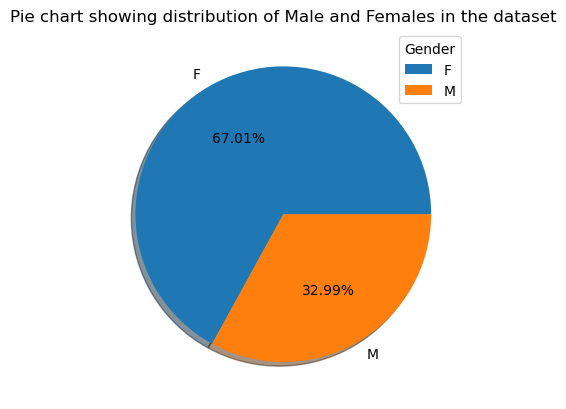

In [133]:
df1=df_cc['CODE_GENDER'].value_counts()
plt.pie(x=df1,autopct="%.2f%%",labels=df1.index,shadow = True)
plt.title("Pie chart showing distribution of Male and Females in the dataset")
plt.legend(title="Gender")
plt.show();


The pie chart shows the **gender distribution** of customers in the dataset.

---

#### **Key Insights:**

* **Females (F)** make up the **majority** of the dataset:

  * **67.01%** of the customers.
* **Males (M)** represent the **minority**:

  * **32.99%** of the customers.

---

This suggests that the dataset is **female-dominated**, with approximately **2 out of every 3** customers being female.

----

In [134]:
print(df_cc['CNT_FAM_MEMBERS'].unique())

[ 2.  1.  5.  3.  4.  6. 15.  7. 20.  9.]


In [135]:
df4=df_cc[df_cc['CNT_FAM_MEMBERS']<5]
fig=px.box(data_frame=df4,x="CNT_FAM_MEMBERS",title="box plot showing count of family members")
fig.update_layout(xaxis=dict(
        tickmode='array',
        tickvals=[1, 2, 3, 4]))
fig.show();

#### observation:- `The box plot reveals several high-count outliers in family size (e.g., 20, 21 members), indicating rare but extreme cases that could skew statistical analysis or require special handling.`

-----

In [136]:
df5=df_cc['DEFAULT'].value_counts().reset_index()
df5

,DEFAULT,count
0,0,35841
1,1,616



---

####  Final Thoughts:


  * **Most customers are not defaulters**.
  * **Class imbalance** is significant.
  * Careful modeling strategies are needed (e.g., resampling, class weighting).

------

### Visual Bivariate analaysis 
------

#### `categorical vs categorical`

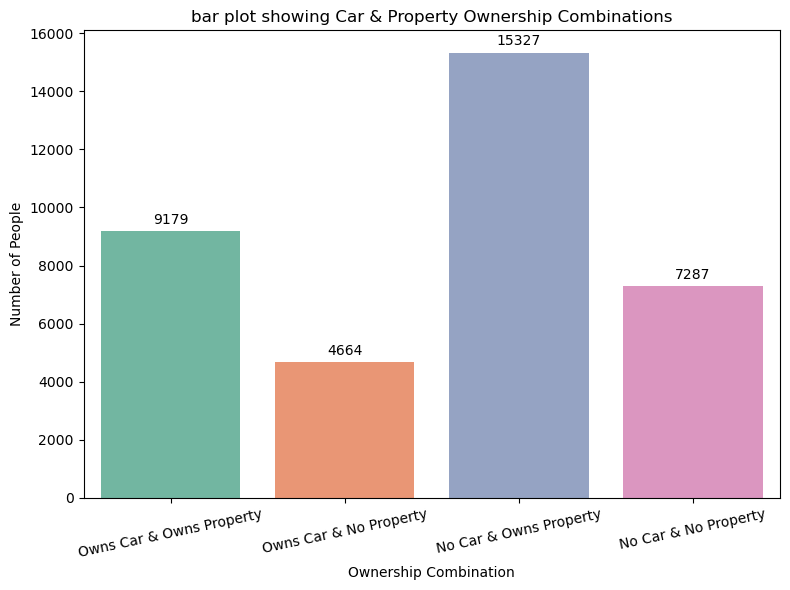

In [137]:


# Create a new column for the combination
df_cc['OWNERSHIP_COMBO'] = df_cc['FLAG_OWN_CAR'].map({'Y': 'Owns Car', 'N': 'No Car'}) + ' & '+ \
                           df_cc['FLAG_OWN_REALTY'].map({'Y': 'Owns Property', 'N': 'No Property'})

# Set the order manually if you want specific ordering
combo_order = [
    'Owns Car & Owns Property',
    'Owns Car & No Property',
    'No Car & Owns Property',
    'No Car & No Property']

# Create the countplot

plt.figure(figsize=(8, 6))
ax = sns.countplot(
    data=df_cc,
    x='OWNERSHIP_COMBO',
    order=combo_order,
    palette='Set2'
)

# Add counts on bars
for container in ax.containers:
    ax.bar_label(container, label_type="edge", padding=3)

# Labels and layout
plt.title("bar plot showing Car & Property Ownership Combinations")
plt.xlabel("Ownership Combination")
plt.ylabel("Number of People")
plt.xticks(rotation=12)
plt.tight_layout()
plt.show();


--------

#### observation: 
- This bar chart shows how people are distributed across four combinations of car and property ownership.
    - Property ownership is more common than car ownership
    - No Car & Owns Property dominates
    - Owns Car & No Property is rarest
--------


#### `Categorical vs Numerical`

In [139]:
fig = px.sunburst(
    df_cc,
    path=["OCCUPATION_TYPE"],      # hierarchy (only 1 level here)
    values="AMT_INCOME_TOTAL",     # size of each slice
    title="Sunburst chart showing share of Annual Income by Occupation Type",
    width=1000,
    height=600
)

fig.update_layout(legend_title_text='Type of Occupation')

# Add percentages as labels
fig.update_traces(
    textinfo="label+percent entry",  # show label and percent
    insidetextorientation='radial'
)
fig.show();


#### observation: `Sunburst map showing how total annual income of dataset is being shared by different occupation types. Unknown is contributing maximum of the total Annual Income, then comes laborers and the least/minimum is HR staff`

#### `Categorical vs Numerical`

In [140]:
df_new=df_cc[(df_cc['AMT_INCOME_TOTAL']<160000) &(df_cc['AMT_INCOME_TOTAL']>100000) &(df_cc['OCCUPATION_TYPE']!="Realty agents")]
fig=px.box(data_frame=df_new,x="OCCUPATION_TYPE", y="AMT_INCOME_TOTAL",
           title="Box plot showing total annual income of the applicant according to Occupation type")
fig.show();

#### observation: `The box plot indicates that total annual income varies moderately across occupations. Managerial and technical roles tend to have slightly higher median incomes, while low-skill and service occupations show comparatively lower medians. However, the overlap between distributions suggests that occupation alone does not strongly differentiate income levels.`

#### `Numerical vs Numerical`

In [141]:
df9=round(df_cc["WORST_STATUS_NUM"].corr(df_cc["DEFAULT"]),2)
df9

0.75

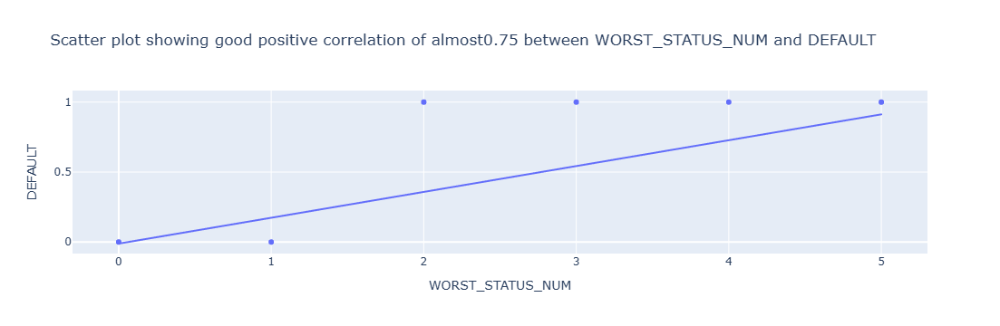

In [142]:
fig=px.scatter(data_frame=df_cc,x="WORST_STATUS_NUM",y="DEFAULT",trendline="ols",
               title=f"Scatter plot showing good positive correlation of almost{df9} "
               "between WORST_STATUS_NUM and DEFAULT")
fig.show();

#### observation: `Scatter plot showing a strong positive correlation of WORST_STATUS_NUM with DEFAULT which is almost 0.75`

In [143]:
df6=df_cc.groupby(['CNT_FAM_MEMBERS'],as_index=False)['DEFAULT'].value_counts()

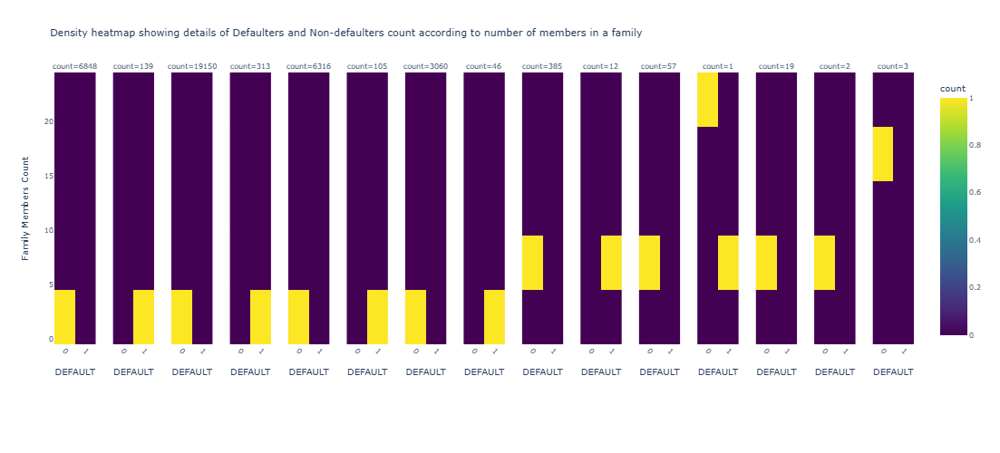

In [144]:

fig = px.density_heatmap(
    data_frame=df6,
    x="DEFAULT",
    y="CNT_FAM_MEMBERS",
    facet_col="count",
    facet_col_spacing=0.02,
    color_continuous_scale="Viridis",
    width=1600,
    height=500,title="Density heatmap showing details of Defaulters and Non-defaulters count according to number of members in a family")


# Update axis labels and spacing
fig.update_layout(
    font=dict(size=8),
    margin=dict(t=80, l=60, r=40, b=120),  # More bottom space for rotated labels
    yaxis_title="Family Members Count")

for axis in fig.layout:
    if axis.startswith('xaxis'):
        fig.layout[axis].update(
            tickmode='array',
            tickvals=[0, 1],
            ticktext=['0', '1'])
fig.write_html(r"Downloads/fig1.html")
# Rotate x-tick labels
fig.update_xaxes(tickangle=45)
fig.show();


#### observation:

- The heatmap shows yellow clusters mainly at lower family member counts, confirming the numerical dominance.

- The density of defaults is very low but visible at lower family counts.

- The non-default groups dominate the color intensity due to their higher counts.

### multivariate analaysis 

#### `All numerical columns`

In [145]:
fig=px.imshow(df_cc.corr(numeric_only=True),text_auto=True,color_continuous_scale='RdBu_r',title="Correlation Matrix",width=900,height=800)
fig.update_layout(
    title="Correlation Matrix showing relationship between various columns in the Dataset",
    xaxis_title="Features",
    yaxis_title="Features")
fig.show();


`Key Takeaways:`
| Feature Pair                       | Correlation | Insight                                               |
| ---------------------------------- | ----------- | ----------------------------------------------------- |
| `DAYS_BIRTH` & `DAYS_EMPLOYED`     | -0.65       | Older people tend to have fewer days employed         |
| `CNT_CHILDREN` & `CNT_FAM_MEMBERS` | 0.89        | Families with more children have more members         |
| Most flags (`FLAG_PHONE`, etc.)    | \~0         | Weak or no direct relationship                        |
| `DEFAULT` with any variable        | \~0         | No strong linear correlation — complex pattern likely |



<Figure size 1500x2000 with 0 Axes>

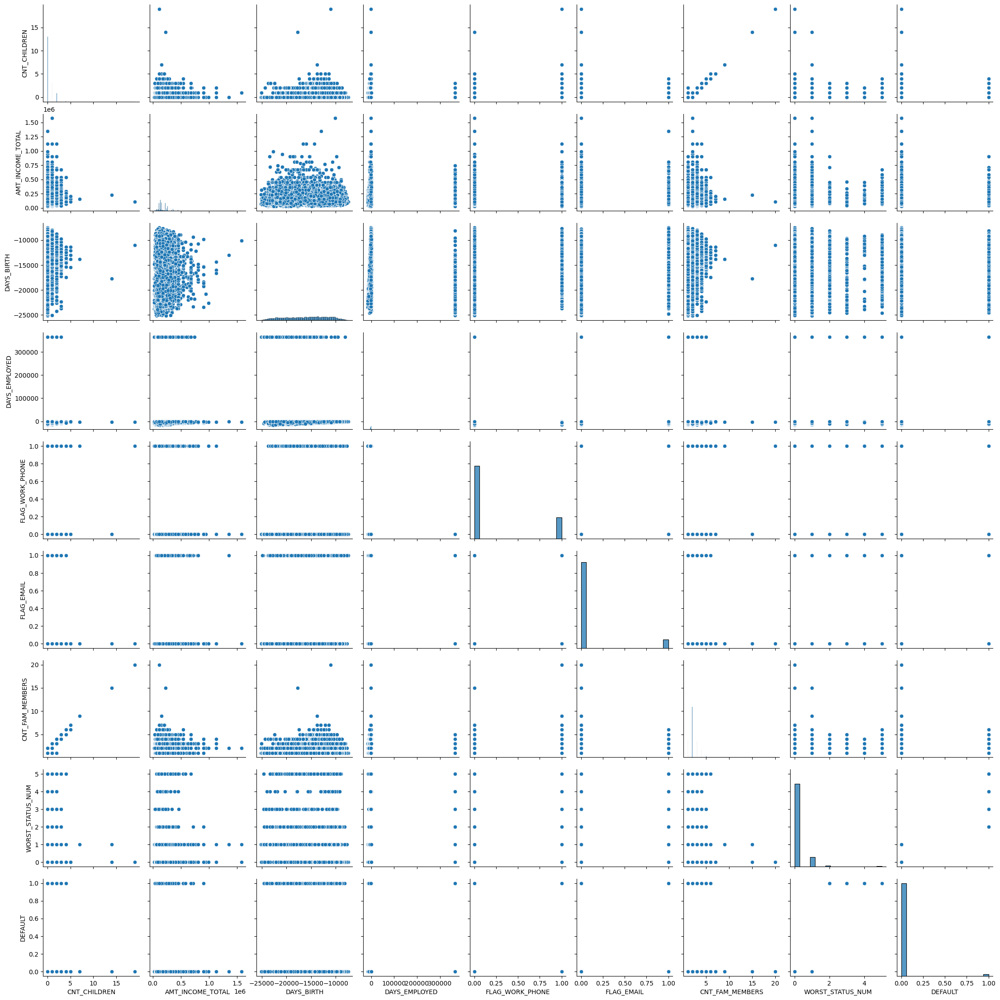

In [146]:
plt.figure(figsize=(15,20))
sns.pairplot(data=df_cc)
plt.show();

`observation: Pair plot(scatter plot for all 12 numerical variables) showing relationship for each numerical variable with another`

#### `Two categorical columns and one numeric column`

In [147]:
df2=df_cc.groupby(['NAME_EDUCATION_TYPE','OCCUPATION_TYPE'],as_index=False)['AMT_INCOME_TOTAL'].value_counts().sort_values(by="AMT_INCOME_TOTAL",ascending=False)
df2

,NAME_EDUCATION_TYPE,OCCUPATION_TYPE,AMT_INCOME_TOTAL,count
306,Higher education,Managers,1575000.00,8
315,Higher education,Managers,1350000.00,6
1251,Secondary / secondary special,Managers,1125000.00,1
340,Higher education,Managers,1125000.00,2
119,Higher education,Core staff,990000.00,4
...,...,...,...,...
842,Secondary / secondary special,Cleaning staff,31500.00,8
772,Lower secondary,unknown,30150.00,3
1545,Secondary / secondary special,unknown,29250.00,7
1451,Secondary / secondary special,Security staff,27000.00,1


In [148]:
df2=df_cc.groupby(['NAME_EDUCATION_TYPE','OCCUPATION_TYPE'],as_index=False)['AMT_INCOME_TOTAL'].value_counts()
fig=px.density_heatmap(data_frame=df2,x="NAME_EDUCATION_TYPE",y="OCCUPATION_TYPE",z="AMT_INCOME_TOTAL",title="Density heatmap plot showing total income amount by occupation and education type",width=1000,height=500)
fig.show();

`observation:This heatmap shows the total amount of income (AMT_INCOME_TOTAL) distributed according to different occupation types (OCCUPATION_TYPE) on the y-axis and education types (NAME_EDUCATION_TYPE) on the x-axis. The color intensity represents the sum of income amounts, where brighter colors (yellow) indicate higher total income. `

In [150]:
df2=df_cc.groupby(['NAME_EDUCATION_TYPE','OCCUPATION_TYPE'],as_index=False)['AMT_INCOME_TOTAL'].value_counts()
fig = px.sunburst(
    data_frame=df2,
    path=["OCCUPATION_TYPE"],      # hierarchy (only 1 level here)
    values="AMT_INCOME_TOTAL", 
    names="NAME_EDUCATION_TYPE",  # size of each slice
    title="Sunburst chart showing share of Annual Income by Occupation Type",
    width=1000,
    height=600
)

fig.update_layout(legend_title_text='Type of Occupation')
fig.show();


In [151]:
df3=df_cc.groupby(["FLAG_OWN_CAR","FLAG_OWN_REALTY"],as_index=False)['NAME_FAMILY_STATUS'].value_counts()
df3

,FLAG_OWN_CAR,FLAG_OWN_REALTY,NAME_FAMILY_STATUS,count
0,N,N,Married,4650
1,N,N,Single / not married,1082
2,N,N,Civil marriage,703
3,N,N,Separated,523
4,N,N,Widow,329
5,N,Y,Married,9694
6,N,Y,Single / not married,2409
7,N,Y,Civil marriage,1257
8,N,Y,Separated,1029
9,N,Y,Widow,938


#### `Three categorical_columns`

In [152]:
fig = px.bar(data_frame=df3,
    x='NAME_FAMILY_STATUS',
    y='count',
    color='FLAG_OWN_REALTY',
    facet_col='FLAG_OWN_CAR',
    barmode='group', 
    title='Grouped Bar Chart showing house and Car Ownership by Family Status',width=800,height=500)
fig.show();


#### observation: `The grouped bar chart displays the relationship between house ownership and family status, further divided based on whether the customer owns a car."`

### Handling outliers 

In [173]:
cols_for_handling = df_cc.select_dtypes(include=['int64','float64']).columns
cols_for_handling

Index(['CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'DAYS_BIRTH', 'DAYS_EMPLOYED',
       'FLAG_WORK_PHONE', 'FLAG_EMAIL', 'CNT_FAM_MEMBERS', 'WORST_STATUS_NUM',
       'DEFAULT'],
      dtype='object')

In [174]:
def get_IQR_values(dataframe,column):
    q1,q2,q3=dataframe[column].quantile(q=[0.25,0.5,0.75])
    IQR=q3-q1
    ub=q3+1.5*IQR
    lb=q1-1.5*IQR
    return lb,ub
    

In [175]:
lb,ub = get_IQR_values(df_cc,"AMT_INCOME_TOTAL")
lb,ub

(-33750.0, 380250.0)

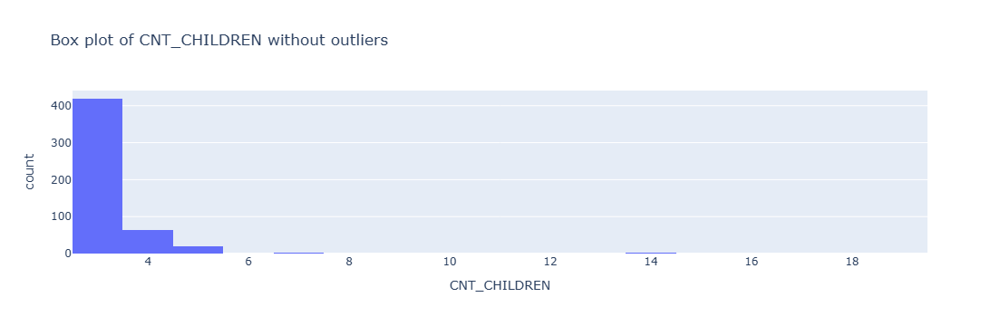

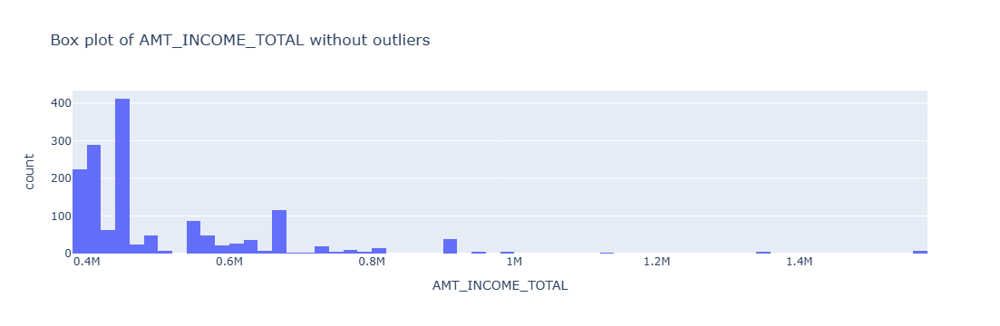

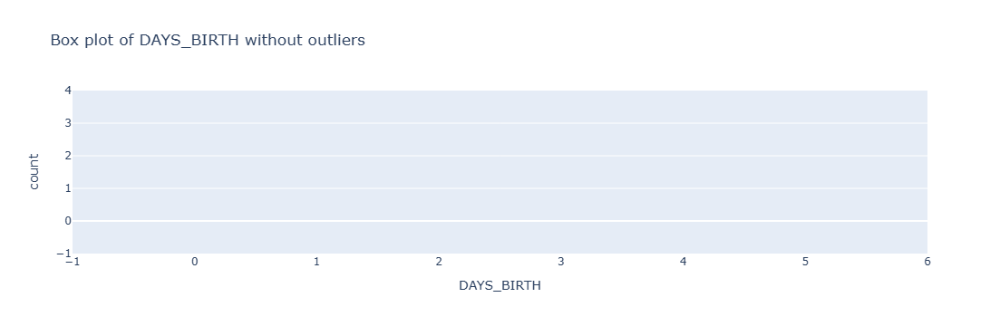

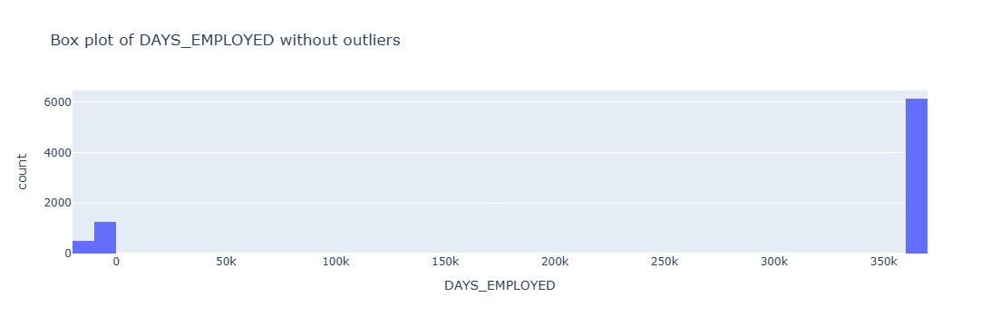

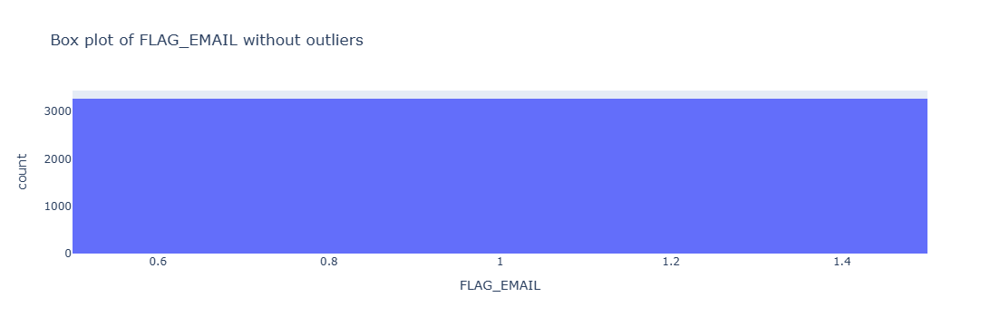

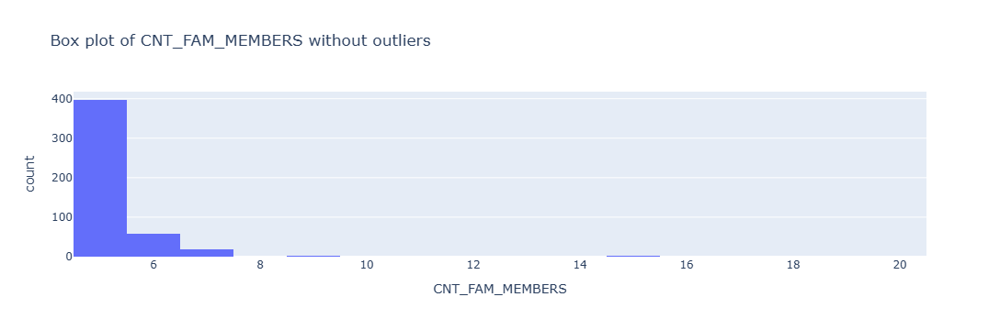

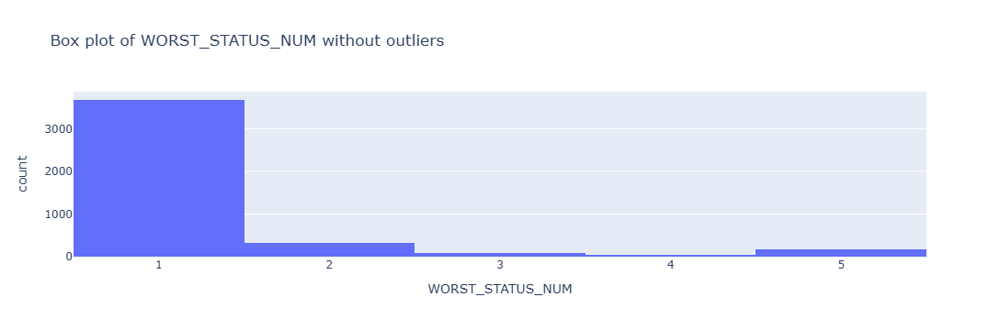

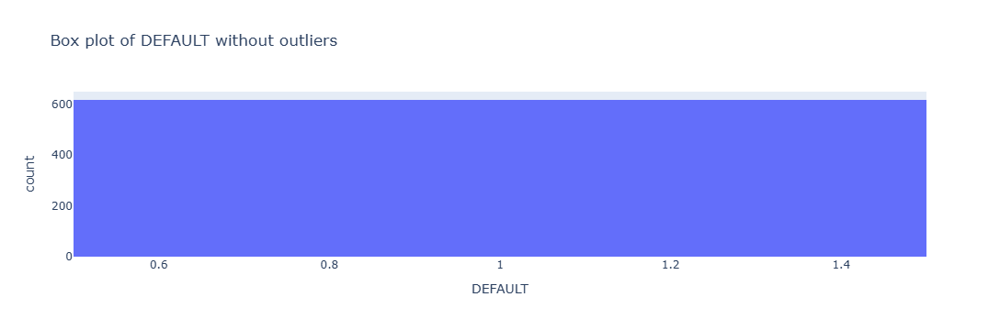

In [176]:
# including outliers

for i in cols_for_handling:
    lb,ub = get_IQR_values(df_cc,i)
    df8=df_cc[(df_cc[i]>ub) | (df_cc[i]<lb)]    
    fig=px.histogram(data_frame=df8,x=i,title=f"Box plot of {i} without outliers")
    fig.show();

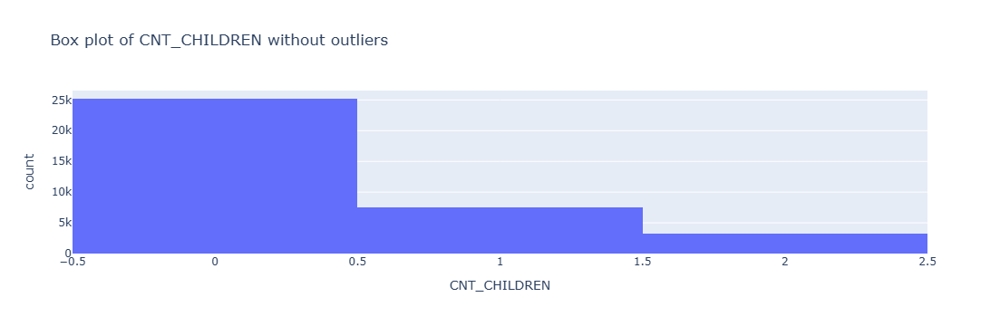

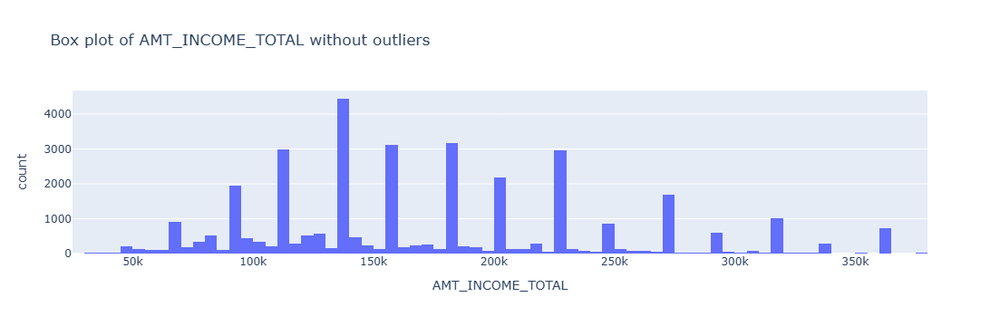

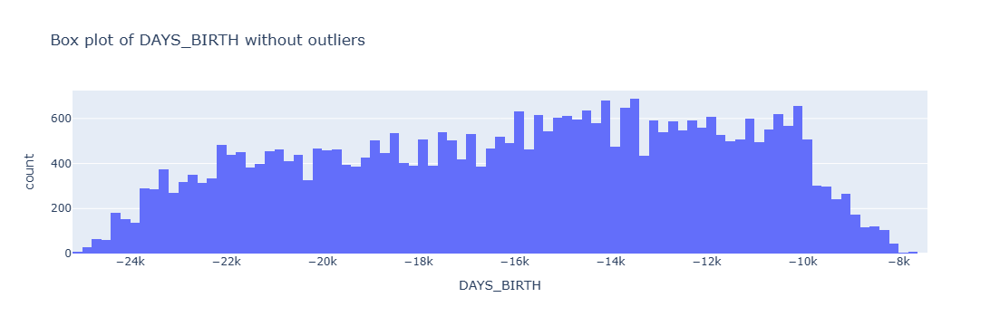

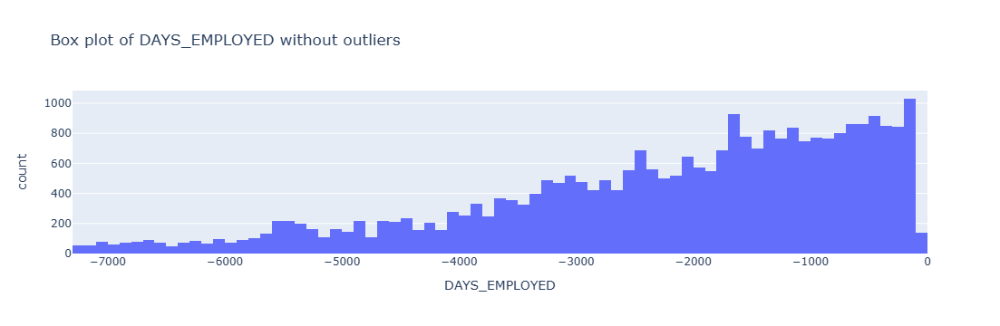

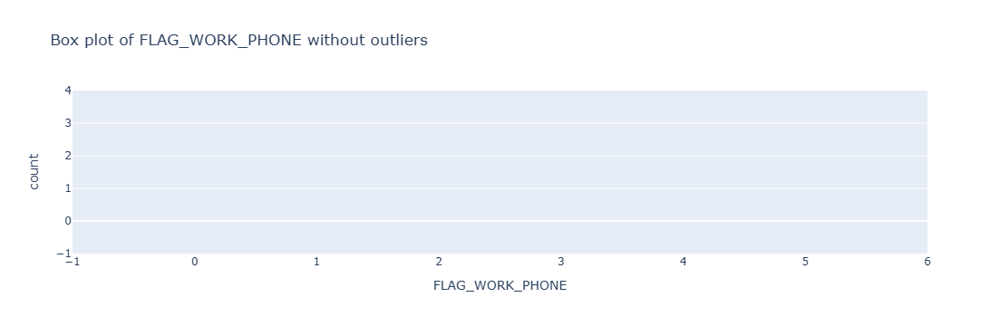

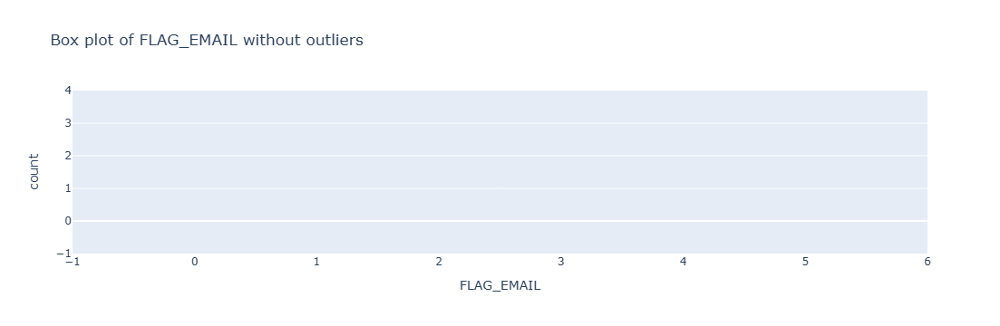

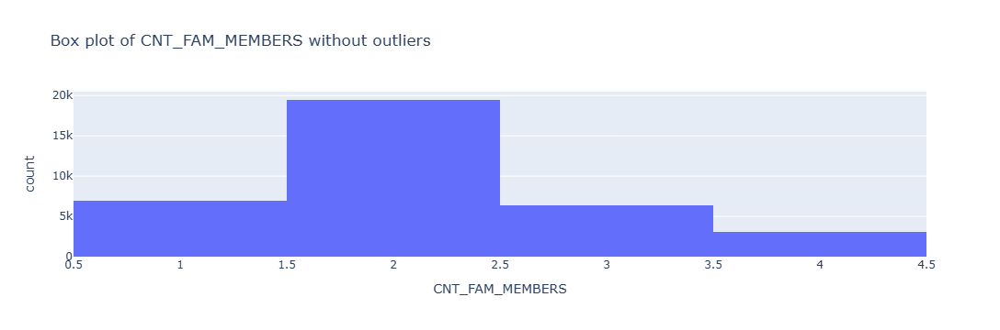

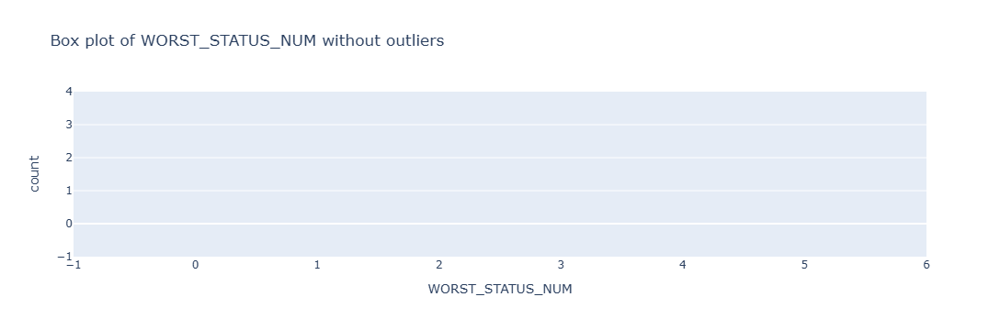

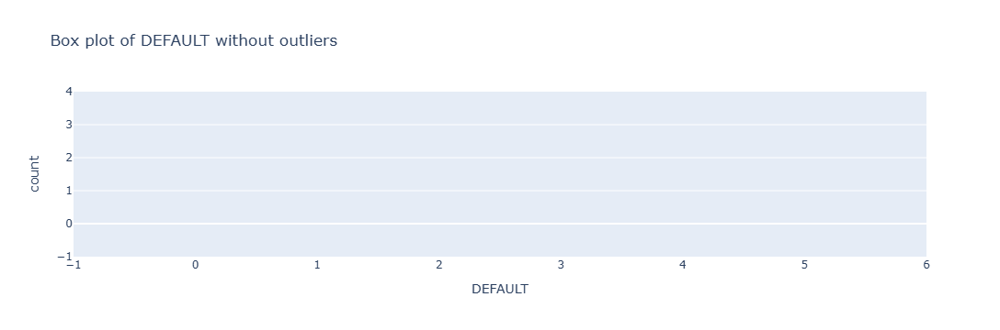

In [177]:
# Excluding outliers

for i in cols_for_handling:
    lb,ub = get_IQR_values(df_cc,i)
    df8=df_cc[(df_cc[i]<ub) & (df_cc[i]>lb)]    
    fig=px.histogram(data_frame=df8,x=i,title=f"Box plot of {i} without outliers")
    fig.show();

In [179]:
df_cc

,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_WORK_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,WORST_STATUS_NUM,LAST_STATUS,DEFAULT,OWNERSHIP_COMBO
0,M,Y,Y,0,427500.00,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,0,unknown,2.00,1,C,0,Owns Car & Owns Property
1,M,Y,Y,0,427500.00,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,0,unknown,2.00,1,C,0,Owns Car & Owns Property
2,M,Y,Y,0,112500.00,Working,Secondary / secondary special,Married,House / apartment,-21474,-1134,0,0,Security staff,2.00,0,C,0,Owns Car & Owns Property
3,F,N,Y,0,270000.00,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,0,1,Sales staff,1.00,0,0,0,No Car & Owns Property
4,F,N,Y,0,270000.00,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,0,1,Sales staff,1.00,0,X,0,No Car & Owns Property
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36452,M,Y,Y,0,315000.00,Working,Secondary / secondary special,Married,House / apartment,-17348,-2420,0,0,Managers,2.00,5,5,1,Owns Car & Owns Property
36453,F,N,Y,0,157500.00,Commercial associate,Higher education,Married,House / apartment,-12387,-1325,0,1,Medicine staff,2.00,5,C,1,No Car & Owns Property
36454,F,N,Y,0,157500.00,Pensioner,Higher education,Married,House / apartment,-12387,-1325,0,1,Medicine staff,2.00,5,C,1,No Car & Owns Property
36455,F,N,Y,0,283500.00,Working,Secondary / secondary special,Married,House / apartment,-17958,-655,0,0,Sales staff,2.00,2,2,1,No Car & Owns Property
